In [ ]:
!pip install -qq wandb
import wandb

wandb.login(key='02c241f212f9509dfc9047b0520a9f402b4e4f6d')

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Balanced: [0.9664603471755981, 0.999772846698761, 0.4072933495044708]
<br>Object split: [0.7557615041732788, 0.9998406171798706, 0.2916567027568817]

In [ ]:
import h5py
from glob import glob
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm
tqdm.pandas()

In [ ]:
columns_x = []
columns_y = []
columns_z = []

for i in range(18):
    columns_x.append(f'{i}_x')
    columns_y.append(f'{i}_y')
    columns_z.append(f'{i}_z')

experiment_columns_initial = ['Object', 'Pose', 'Experiment', 'Length', 'Accepted']

frames = []
lens = []
rejects = 0
accepts = 0

exp_df_1 = pd.DataFrame(columns=experiment_columns_initial)

print('Reading experiment data from h5 files')
for file_path in tqdm(glob('/content/drive/Othercomputers/My Laptop (1)/MSc Project/Codebase/Data/tactile_object_recognition/*.h5')):
    hf = h5py.File(file_path, 'r')
    name = list(hf.keys())[0]
    poses = list(hf[name].keys())
    for pose in poses:
        experiments = list(hf[f'{name}/{pose}'].keys())
        for experiment in experiments:
            path = f'{name}/{pose}/{experiment}'
            df_x = pd.DataFrame(np.array(hf[f'{path}/tactile_data_raw/x']).T, columns=columns_x)
            df_y = pd.DataFrame(np.array(hf[f'{path}/tactile_data_raw/y']).T, columns=columns_y)
            df_z = pd.DataFrame(np.array(hf[f'{path}/tactile_data_raw/z']).T, columns=columns_z)

            result = pd.concat([df_x, df_y, df_z], axis=1, join="inner")

            result['timestamp'] = np.array(hf[f'{path}/tactile_timestamps'])
            result['change_label'] = np.array(hf[f'{path}/tactile_changes_label'])

            exp_length = (len(result)/180)
            lens.append(exp_length)
            if exp_length < 15:
                rejects = rejects + 1
                is_in = False
            else:
                is_in = True
                accepts = accepts + 1
                result['object'] = name
                result['pose'] = pose
                result['experiment'] = experiment
                frames.append(result)

            exp_df_1.loc[len(exp_df_1)] = [name, pose, experiment, exp_length, is_in]
            
    hf.close()
df = pd.concat(frames)
print(f'{accepts} experiments accepted out of {len(lens)}')

Reading experiment data from h5 files


  0%|          | 0/10 [00:00<?, ?it/s]

426 experiments accepted out of 571


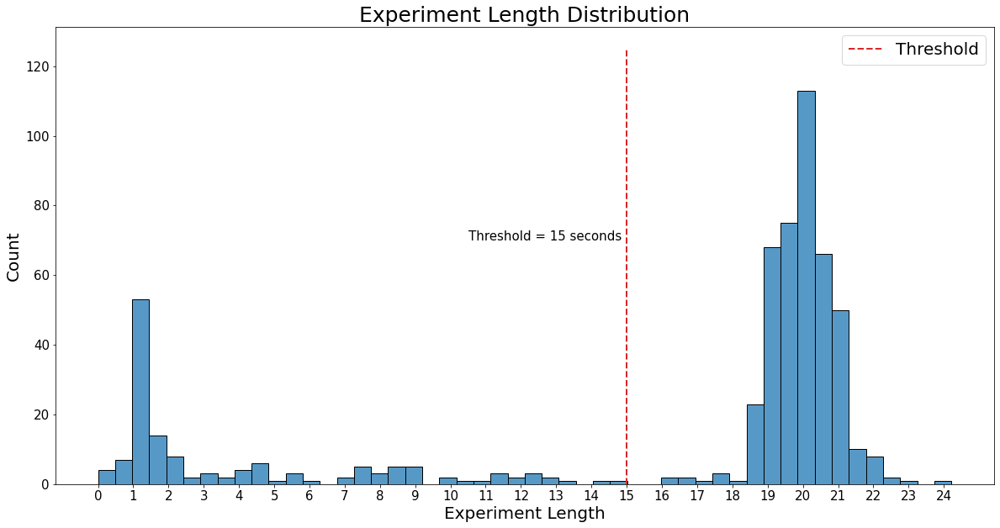

In [ ]:
#Plot showing threshold
fig, ax = plt.subplots(figsize=(20, 10))
plt.xticks(fontsize=15 )
plt.yticks(fontsize=15 )
plt.xlabel('Experiment Length', fontsize=20)
plt.ylabel('Count', fontsize=20)
plt.title('Experiment Length Distribution', fontsize=25)
hs = sns.histplot(lens, bins= 50, ax=ax)
ax.set_xticks(np.arange(25))
hs.vlines(x=[15], ymin=0, ymax=125, colors=['tab:red'], ls='--', lw=2, label='Threshold')
plt.legend(fontsize=20, title_fontsize=15)
plt.text(10.5,70,'Threshold = 15 seconds', fontsize=15)
plt.show()

In [ ]:
initial_rows = 1635859
only_longs = 1533332

In [ ]:
objects = df.object.unique()
weights = [28.0,165.0,24.0,210.0,16.0,78.0,125.0,227.0,127.0,62.0]

weight_df = pd.DataFrame()

weight_df['object'] = objects
weight_df['Weights'] = weights

weight_df
final_df = df.merge(weight_df, left_on='object', right_on='object')
weight_df.sort_values(by='Weights', ascending=True)

,object,Weights
4,metalBox,16.0
2,brush,24.0
0,SpoolSolder,28.0
9,marker,62.0
5,adversarialPipe,78.0
6,legoDuplo,125.0
8,tennisBall,127.0
1,marbleNet,165.0
3,teddyBear,210.0
7,screwDriver,227.0


In [ ]:
count = 0
selected_count = 0
selected = []

exp_df_2 = pd.DataFrame(columns=['Object', 'Pose', 'Experiment', 'Accepted', 'Note'])

pose_count = []
count_1 = []
print('Extracting lift phase and rejecting invalid experiments...')
for object in tqdm(objects):
    object_df = final_df.loc[final_df['object'] == object]
    poses = object_df.pose.unique()
    print(f'Object {object} has {len(poses)} poses')
    pose_count.append(len(poses))
    #print(f'Object {object} has {len(poses)} poses')
    for pose in poses:
        pose_df = object_df[object_df['pose'] == pose]
        experiments = pose_df.experiment.unique()
        count_2 = 0
        for experiment in experiments:
            exp_df = pose_df[pose_df['experiment']==experiment].copy()
            count = count + 1
            
            #Getting rolling mean to 20
            exp_df['rolling_mean'] = exp_df['change_label'].rolling(window=20).mean()
            
            #Gettin strips of 0s on rolling mean
            idx_pairs = np.where(np.diff(np.hstack(([False],exp_df['rolling_mean'] ==0,[False]))))[0].reshape(-1,2)

            #Get length of strips
            lengths = np.diff(idx_pairs,axis=1).flatten()

            #Removing strips less that 100 samples long
            idx_pairs = idx_pairs[lengths>100]

            #Check if strips are over 10 seconds
            if((len(lengths[lengths > 1800])>0)):
                exp_df_2.loc[len(exp_df_2)] = [object, pose, experiment, False, 'Strip too long' ]
                print(object, pose, experiment, False, 'Strip too long')
                continue
            #Check if there are less than 2 long strips
            elif((len(idx_pairs)<2)):
                exp_df_2.loc[len(exp_df_2)] = [object, pose, experiment, False, 'Less than 2 strips' ]
                continue
            else:
                selected_count = selected_count + 1

                #Getting the longest 4 strips
                if(len(idx_pairs)>3):
                    longest_4 = np.flip(np.argpartition(np.diff(idx_pairs,axis=1).flatten(), -4)[-4:])
                    longest_4_idx = idx_pairs[longest_4]
                else:
                    longest_4_idx = idx_pairs

                #Arranging strips by time, earlier first
                a = longest_4_idx.tolist() 
                longest_4_idx = np.array(sorted(a, key=lambda a_entry: a_entry[0]))

                #Getting dataframe index
                longest_4_idx = longest_4_idx + exp_df.index[0]

                #Initializing lift phase column
                exp_df['lift'] = False
                
                #Getting the second strip location
                lift_start = longest_4_idx[1][0]
                lift_end = longest_4_idx[1][1]

                #Setting the lift areas to ture
                exp_df.loc[lift_start:lift_end, 'lift'] =  True
                #If small interruption during lift, add the rest of the portion too
                remark = 'Normal'
                if(len(longest_4_idx)>2):
                    next_break_length = longest_4_idx[2][0]-longest_4_idx[1][1]
                    next_break_mean = exp_df.loc[longest_4_idx[1][1]: longest_4_idx[2][0], "rolling_mean"].mean()
                    if((next_break_length<90) and (next_break_mean<0.4)):
                        lift_start = longest_4_idx[2][0]
                        lift_end = longest_4_idx[2][1]
                        exp_df.loc[lift_start:lift_end, 'lift'] =  True
                        remark = 'Appended tail'
                count_2 = count_2 + 1 
                exp_df_2.loc[len(exp_df_2)] = [object, pose, experiment, True, remark ]
                selected.append(exp_df.drop(['rolling_mean'], axis=1))
            count_1.append(count_2)  

print(f'Selected {selected_count} out of {count} experiments')

cleaned_df = pd.concat(selected)


Extracting lift phase and rejecting invalid experiments...


  0%|          | 0/10 [00:00<?, ?it/s]

Object SpoolSolder has 5 poses
Object marbleNet has 5 poses
marbleNet Pose2 Exp6 False Strip too long
marbleNet Pose5 Exp8 False Strip too long
marbleNet Pose5 Exp9 False Strip too long
Object brush has 2 poses
Object teddyBear has 5 poses
teddyBear Pose1 Exp12 False Strip too long
teddyBear Pose1 Exp13 False Strip too long
teddyBear Pose2 Exp11 False Strip too long
teddyBear Pose2 Exp13 False Strip too long
teddyBear Pose2 Exp2 False Strip too long
teddyBear Pose2 Exp8 False Strip too long
teddyBear Pose2 Exp9 False Strip too long
teddyBear Pose3 Exp5 False Strip too long
teddyBear Pose3 Exp7 False Strip too long
teddyBear Pose3 Exp8 False Strip too long
teddyBear Pose3 Exp9 False Strip too long
teddyBear Pose4 Exp1 False Strip too long
Object metalBox has 5 poses
metalBox Pose3 Exp15 False Strip too long
Object adversarialPipe has 5 poses
adversarialPipe Pose3 Exp9 False Strip too long
adversarialPipe Pose4 Exp11 False Strip too long
adversarialPipe Pose4 Exp14 False Strip too long
a

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


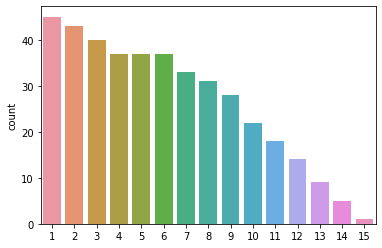

In [ ]:
sns.countplot(count_1)

In [ ]:
cleaned_df

,0_x,1_x,2_x,3_x,4_x,5_x,6_x,7_x,8_x,9_x,...,15_z,16_z,17_z,timestamp,change_label,object,pose,experiment,Weights,lift
0,33484.0,33256.0,32691.0,33023.0,32906.0,32870.0,33152.0,33284.0,32853.0,33064.0,...,18880.0,18283.0,18725.0,0.000000,0,SpoolSolder,Pose1,Exp1,28.0,False
1,33484.0,33258.0,32689.0,33020.0,32908.0,32868.0,33152.0,33288.0,32859.0,33063.0,...,18879.0,18284.0,18730.0,5.395889,1,SpoolSolder,Pose1,Exp1,28.0,False
2,33495.0,33265.0,32709.0,33026.0,32918.0,32883.0,33156.0,33288.0,32861.0,33060.0,...,18881.0,18291.0,18746.0,10.899782,1,SpoolSolder,Pose1,Exp1,28.0,False
3,33498.0,33264.0,32725.0,33026.0,32918.0,32883.0,33150.0,33289.0,32865.0,33058.0,...,18881.0,18290.0,18742.0,16.594648,1,SpoolSolder,Pose1,Exp1,28.0,False
4,33491.0,33263.0,32710.0,33024.0,32917.0,32885.0,33149.0,33286.0,32856.0,33055.0,...,18881.0,18295.0,18759.0,22.081137,1,SpoolSolder,Pose1,Exp1,28.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1533327,33146.0,32753.0,32189.0,33306.0,33163.0,65535.0,33126.0,33175.0,65535.0,33195.0,...,18823.0,18246.0,65535.0,20548.625708,0,marker,Pose5,Exp4,62.0,False
1533328,33144.0,32751.0,32193.0,33304.0,33164.0,65535.0,33122.0,33173.0,65535.0,33188.0,...,18823.0,18247.0,65535.0,20554.067850,0,marker,Pose5,Exp4,62.0,False
1533329,33148.0,32752.0,32190.0,33305.0,33164.0,65535.0,33123.0,33172.0,65535.0,33191.0,...,18823.0,18247.0,65535.0,20559.738874,0,marker,Pose5,Exp4,62.0,False
1533330,33147.0,32753.0,32191.0,33304.0,33162.0,65535.0,33125.0,33174.0,65535.0,33187.0,...,18821.0,18248.0,65535.0,20565.053225,0,marker,Pose5,Exp4,62.0,False


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


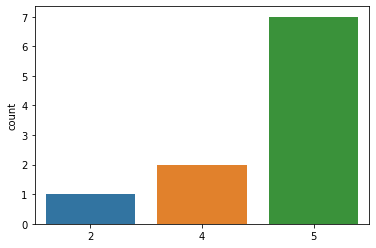

In [ ]:
sns.countplot(pose_count)

<ipython-input-67-bdf6615e8a23>:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exp = final_df.loc[final_df['object'] == 'adversarialPipe'][final_df['pose'] == 'Pose5'][final_df['experiment'] == 'Exp12']


Appending leftout lift tail!


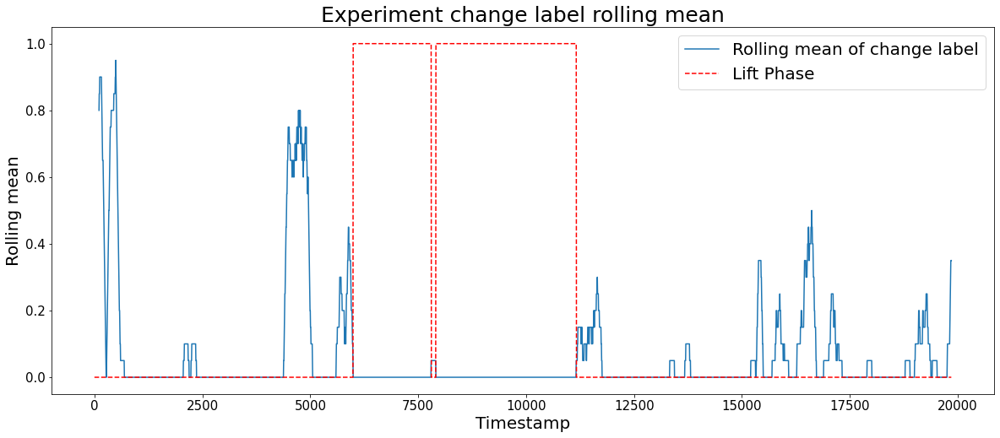

In [ ]:
#One spike
#exp = final_df.loc[final_df['object'] == 'adversarialPipe'][final_df['pose'] == 'Pose4'][final_df['experiment'] == 'Exp14']
#exp = final_df.loc[final_df['object'] == 'adversarialPipe'][final_df['pose'] == 'Pose4'][final_df['experiment'] == 'Exp15']
#exp = final_df.loc[final_df['object'] == 'adversarialPipe'][final_df['pose'] == 'Pose4'][final_df['experiment'] == 'Exp8']
#Small Island
#exp = final_df.loc[final_df['object'] == 'adversarialPipe'][final_df['pose'] == 'Pose4'][final_df['experiment'] == 'Exp11']

#Normal
#exp = final_df.loc[final_df['object'] == 'adversarialPipe'][final_df['pose'] == 'Pose4'][final_df['experiment'] == 'Exp7']

#Interrupted lift
exp = final_df.loc[final_df['object'] == 'adversarialPipe'][final_df['pose'] == 'Pose5'][final_df['experiment'] == 'Exp12']

#Interrupted tail, unfixed
#exp = final_df.loc[final_df['object'] == 'adversarialPipe'][final_df['pose'] == 'Pose5'][final_df['experiment'] == 'Exp3']

#exp = final_df.loc[final_df['object'] == 'brush'][final_df['pose'] == 'Pose4'][final_df['experiment'] == 'Exp13']

exp['rolling_mean'] = exp['change_label'].rolling(window=20).mean()
f, ax = plt.subplots(1, figsize=(20, 8))
sns.lineplot(data=exp, x='timestamp', y='rolling_mean', ax=ax, label='Rolling mean of change label')

plt.xticks(fontsize=15 )
plt.yticks(fontsize=15 )
plt.xlabel('Timestamp', fontsize=20)
plt.ylabel('Rolling mean', fontsize=20)
plt.title('Experiment change label rolling mean', fontsize=25)
plt.legend(fontsize=20, title_fontsize=15)
idx_pairs = np.where(np.diff(np.hstack(([False],exp['rolling_mean'] ==0,[False]))))[0].reshape(-1,2)
#Removing islands less than 100 samples or over 10 seconds
lengths = np.diff(idx_pairs,axis=1).flatten()
if((len(lengths[lengths > 1800])>0)):
    print('Experiment invalid, Very long strip found!')
    

elif((len(idx_pairs)<2)):
    print('Experiment invalid!!! Less than 2 strips')
else:
    idx_pairs = idx_pairs[lengths>100]
    if(len(idx_pairs)>2):
        longest_4 = np.flip(np.argpartition(np.diff(idx_pairs,axis=1).flatten(), -4)[-4:])
        longest_4_idx = idx_pairs[longest_4]
    else:
        longest_4_idx = idx_pairs

    a = longest_4_idx.tolist() 
    longest_4_idx = np.array(sorted(a, key=lambda a_entry: a_entry[0]))

    longest_4_idx = longest_4_idx + exp.index[0]
    exp['lift'] = False
    lift_start = longest_4_idx[1][0]
    lift_end = longest_4_idx[1][1]
    exp.loc[lift_start:lift_end, 'lift'] =  True
    #If small interruption during lift, add the rest of the portion too
    if(len(longest_4_idx)>2):
        next_break_length = longest_4_idx[2][0]-longest_4_idx[1][1]
        next_break_mean = exp.loc[longest_4_idx[1][1]: longest_4_idx[2][0], "rolling_mean"].mean()
        if((next_break_length<90) and (next_break_mean<0.4)):
            lift_start = longest_4_idx[2][0]
            lift_end = longest_4_idx[2][1]
            exp.loc[lift_start:lift_end, 'lift'] =  True
            print('Appending leftout lift tail!')

    sns.lineplot(data=exp, x='timestamp', y='lift', ax=ax, color='red', label='Lift Phase', ls='--')
    plt.legend(fontsize=20, title_fontsize=15)
    plt.show()

In [ ]:
cleaned_df

,0_x,1_x,2_x,3_x,4_x,5_x,6_x,7_x,8_x,9_x,...,15_z,16_z,17_z,timestamp,change_label,object,pose,experiment,Weights,lift
0,33484.0,33256.0,32691.0,33023.0,32906.0,32870.0,33152.0,33284.0,32853.0,33064.0,...,18880.0,18283.0,18725.0,0.000000,0,SpoolSolder,Pose1,Exp1,28.0,False
1,33484.0,33258.0,32689.0,33020.0,32908.0,32868.0,33152.0,33288.0,32859.0,33063.0,...,18879.0,18284.0,18730.0,5.395889,1,SpoolSolder,Pose1,Exp1,28.0,False
2,33495.0,33265.0,32709.0,33026.0,32918.0,32883.0,33156.0,33288.0,32861.0,33060.0,...,18881.0,18291.0,18746.0,10.899782,1,SpoolSolder,Pose1,Exp1,28.0,False
3,33498.0,33264.0,32725.0,33026.0,32918.0,32883.0,33150.0,33289.0,32865.0,33058.0,...,18881.0,18290.0,18742.0,16.594648,1,SpoolSolder,Pose1,Exp1,28.0,False
4,33491.0,33263.0,32710.0,33024.0,32917.0,32885.0,33149.0,33286.0,32856.0,33055.0,...,18881.0,18295.0,18759.0,22.081137,1,SpoolSolder,Pose1,Exp1,28.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1533327,33146.0,32753.0,32189.0,33306.0,33163.0,65535.0,33126.0,33175.0,65535.0,33195.0,...,18823.0,18246.0,65535.0,20548.625708,0,marker,Pose5,Exp4,62.0,False
1533328,33144.0,32751.0,32193.0,33304.0,33164.0,65535.0,33122.0,33173.0,65535.0,33188.0,...,18823.0,18247.0,65535.0,20554.067850,0,marker,Pose5,Exp4,62.0,False
1533329,33148.0,32752.0,32190.0,33305.0,33164.0,65535.0,33123.0,33172.0,65535.0,33191.0,...,18823.0,18247.0,65535.0,20559.738874,0,marker,Pose5,Exp4,62.0,False
1533330,33147.0,32753.0,32191.0,33304.0,33162.0,65535.0,33125.0,33174.0,65535.0,33187.0,...,18821.0,18248.0,65535.0,20565.053225,0,marker,Pose5,Exp4,62.0,False


In [ ]:
experiments_df = cleaned_df.loc[cleaned_df['lift']].drop([ 'lift', 'timestamp', 'change_label'], axis=1).copy()

lift_only = cleaned_df.loc[cleaned_df['lift']].drop(['lift', 'timestamp', 'change_label', 'object', 'pose', 'experiment'], axis=1)
experiments_df


,0_x,1_x,2_x,3_x,4_x,5_x,6_x,7_x,8_x,9_x,...,12_z,13_z,14_z,15_z,16_z,17_z,object,pose,experiment,Weights
1542,33493.0,33286.0,32724.0,33045.0,32964.0,32959.0,33103.0,31002.0,28919.0,33001.0,...,18780.0,18828.0,18996.0,18990.0,18492.0,19045.0,SpoolSolder,Pose1,Exp1,28.0
1543,33494.0,33288.0,32728.0,33048.0,32965.0,32959.0,33103.0,30999.0,28897.0,33002.0,...,18779.0,18826.0,18997.0,18990.0,18492.0,19044.0,SpoolSolder,Pose1,Exp1,28.0
1544,33497.0,33286.0,32726.0,33050.0,32967.0,32962.0,33106.0,30991.0,28886.0,33002.0,...,18778.0,18826.0,18996.0,18989.0,18493.0,19043.0,SpoolSolder,Pose1,Exp1,28.0
1545,33496.0,33289.0,32726.0,33044.0,32966.0,32962.0,33105.0,30991.0,28868.0,33003.0,...,18777.0,18825.0,18995.0,18988.0,18492.0,19043.0,SpoolSolder,Pose1,Exp1,28.0
1546,33495.0,33288.0,32726.0,33047.0,32968.0,32963.0,33104.0,30989.0,28851.0,33003.0,...,18778.0,18825.0,18995.0,18991.0,18491.0,19043.0,SpoolSolder,Pose1,Exp1,28.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1530979,15202.0,28063.0,26821.0,34207.0,33505.0,65535.0,33074.0,33161.0,65535.0,33162.0,...,18456.0,18617.0,65535.0,18823.0,18250.0,65535.0,marker,Pose5,Exp4,62.0
1530980,15211.0,28063.0,26803.0,34201.0,33502.0,65535.0,33071.0,33162.0,65535.0,33163.0,...,18458.0,18618.0,65535.0,18821.0,18253.0,65535.0,marker,Pose5,Exp4,62.0
1530981,15190.0,28060.0,26817.0,34201.0,33501.0,65535.0,33073.0,33165.0,65535.0,33163.0,...,18457.0,18618.0,65535.0,18824.0,18254.0,65535.0,marker,Pose5,Exp4,62.0
1530982,15204.0,28068.0,26827.0,34223.0,33507.0,65535.0,33072.0,33160.0,65535.0,33162.0,...,18457.0,18617.0,65535.0,18821.0,18251.0,65535.0,marker,Pose5,Exp4,62.0


In [ ]:
experiments_df.groupby('lift').count()

KeyError: ignored

In [ ]:
experiments_df

,0_x,1_x,2_x,3_x,4_x,5_x,6_x,7_x,8_x,9_x,...,12_z,13_z,14_z,15_z,16_z,17_z,object,pose,experiment,Weights
1542,33493.0,33286.0,32724.0,33045.0,32964.0,32959.0,33103.0,31002.0,28919.0,33001.0,...,18780.0,18828.0,18996.0,18990.0,18492.0,19045.0,SpoolSolder,Pose1,Exp1,28.0
1543,33494.0,33288.0,32728.0,33048.0,32965.0,32959.0,33103.0,30999.0,28897.0,33002.0,...,18779.0,18826.0,18997.0,18990.0,18492.0,19044.0,SpoolSolder,Pose1,Exp1,28.0
1544,33497.0,33286.0,32726.0,33050.0,32967.0,32962.0,33106.0,30991.0,28886.0,33002.0,...,18778.0,18826.0,18996.0,18989.0,18493.0,19043.0,SpoolSolder,Pose1,Exp1,28.0
1545,33496.0,33289.0,32726.0,33044.0,32966.0,32962.0,33105.0,30991.0,28868.0,33003.0,...,18777.0,18825.0,18995.0,18988.0,18492.0,19043.0,SpoolSolder,Pose1,Exp1,28.0
1546,33495.0,33288.0,32726.0,33047.0,32968.0,32963.0,33104.0,30989.0,28851.0,33003.0,...,18778.0,18825.0,18995.0,18991.0,18491.0,19043.0,SpoolSolder,Pose1,Exp1,28.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1530979,15202.0,28063.0,26821.0,34207.0,33505.0,65535.0,33074.0,33161.0,65535.0,33162.0,...,18456.0,18617.0,65535.0,18823.0,18250.0,65535.0,marker,Pose5,Exp4,62.0
1530980,15211.0,28063.0,26803.0,34201.0,33502.0,65535.0,33071.0,33162.0,65535.0,33163.0,...,18458.0,18618.0,65535.0,18821.0,18253.0,65535.0,marker,Pose5,Exp4,62.0
1530981,15190.0,28060.0,26817.0,34201.0,33501.0,65535.0,33073.0,33165.0,65535.0,33163.0,...,18457.0,18618.0,65535.0,18824.0,18254.0,65535.0,marker,Pose5,Exp4,62.0
1530982,15204.0,28068.0,26827.0,34223.0,33507.0,65535.0,33072.0,33160.0,65535.0,33162.0,...,18457.0,18617.0,65535.0,18821.0,18251.0,65535.0,marker,Pose5,Exp4,62.0


In [ ]:
import random

all_players = list(range(12))

random.shuffle(all_players)

lens = []
test = []
train = []
count = 0
for object in tqdm(objects):
    object_df = experiments_df.loc[experiments_df['object'] == object]
    poses = object_df.pose.unique()
    random.shuffle(poses)
    if(len(poses) == 5):
      test_poses = poses[:1]
    elif(len(poses) == 4):
      test_poses = poses[:1]
    elif(len(poses) == 2):
      test_poses = poses[:1]
    for pose in poses:
        pose_df = object_df[object_df['pose'] == pose]
        if pose in test_poses:
          test.append(pose_df)
        else:
          train.append(pose_df)

experiment_test = pd.concat(test)
experiment_train = pd.concat(train)

  0%|          | 0/10 [00:00<?, ?it/s]

In [ ]:
print(experiments_df['Weights'].value_counts())

210.0    41810
165.0    29528
127.0    24914
16.0     22523
62.0     20530
78.0     19462
125.0    17985
28.0     12411
227.0     7805
24.0      1720
Name: Weights, dtype: int64


In [ ]:
an_array = np.array(experiments_df['Weights'].unique()).sort()
bins = [0, 50, 2, 4, 10]

sns.countplot(x='Weights', data=balanced_df)


In [ ]:
experiment_test = experiments_df[np.isin(experiments_df['Weights'], [24.0, 62.0, 127.0])]
experiment_train = experiments_df[np.invert(np.isin(experiments_df['Weights'], [24.0, 62.0, 127.0]))]
len(experiment_train)/len(experiments_df)

0.7626228056047673

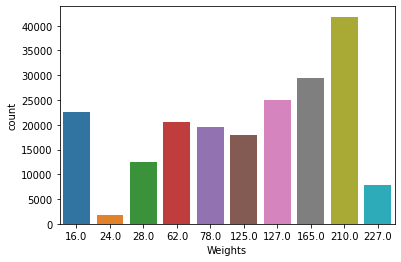

In [ ]:
sns.countplot(x='Weights', data=experiments_df)

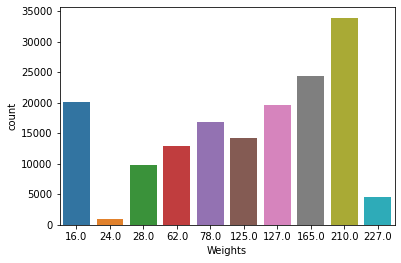

In [ ]:
sns.countplot(x='Weights', data=experiment_train)

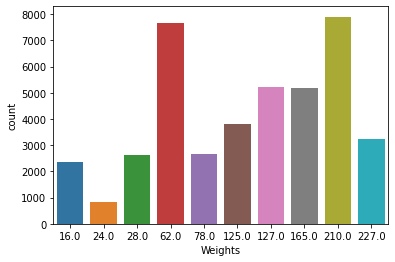

In [ ]:
sns.countplot(x='Weights', data=experiment_test)

In [ ]:
balanced_df = lift_only.drop(lift_only[lift_only.Weights == 24.0].index).drop(lift_only[lift_only.Weights == 227.0].index)

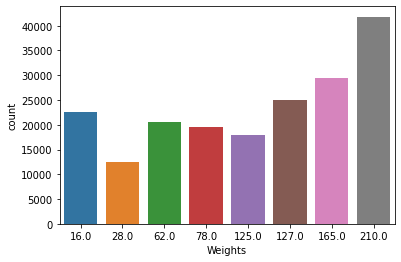

In [ ]:
sns.countplot(x='Weights', data=balanced_df)

189163

# Scikit learn

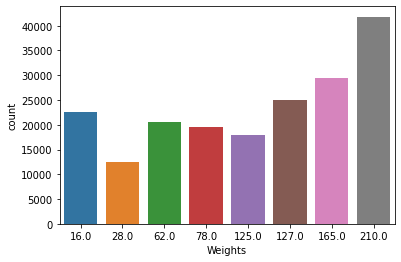

In [ ]:
sample_10K = balanced_df.sample(n=10000, random_state=20)
X = balanced_df.iloc[:,:54]
y = np.array(balanced_df.Weights)
sns.countplot(x='Weights', data=balanced_df)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_digits
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.decomposition import PCA, NMF
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

In [ ]:
sc = StandardScaler()

X_train = sc.fit_transform(X_train)
X_test = sc.transform (X_test)

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
GBR = GradientBoostingRegressor()
parameters = {'learning_rate': [0.01,0.1],
                  'subsample'    : [0.9, 0.5, 0.1],
                  'n_estimators' : [50,100],
                 }

grid_GBR = GridSearchCV(estimator=GBR, param_grid = parameters, cv = 5, n_jobs=8, verbose=5)
grid_GBR.fit(X_train, y_train)


Fitting 5 folds for each of 12 candidates, totalling 60 fits


In [ ]:
best_GBR = grid_GBR.best_estimator_
best_GBR

GradientBoostingRegressor(subsample=0.9)

In [ ]:
best_GBR = GradientBoostingRegressor(subsample=0.9)
best_GBR.fit(X_train, y_train)

GradientBoostingRegressor(subsample=0.9)

In [ ]:
print("\n The best score across ALL searched params:\n",grid_GBR.best_score_)


 The best score across ALL searched params:
 0.985625392902864


In [ ]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error


In [ ]:
def print_scores(model, X_test, y_test):
    y_pred = best_GBR.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f'R² score: {r2} \t Mean Absolute Error: {mae} \t Mean Squared Error: {mse}')

In [ ]:
print_scores(best_GBR, X_test, y_test)

R² score: 0.9876337265071691 	 Mean Absolute Error: 5.567433640546711 	 Mean Squared Error: 61.70742453601584


In [ ]:
y_pred = best_GBR.predict(X_test)
result_df = pd.DataFrame(dict(Actual=y_test, Predicted=y_pred))
result_df = result_df.merge(weight_df, left_on='Actual', right_on='Weights')
result_df = result_df.loc[:, ('object', 'Weights', 'Predicted')]
result_df

,object,Weights,Predicted
0,marbleNet,210.0,216.785595
1,marbleNet,210.0,194.778548
2,marbleNet,210.0,197.927060
3,marbleNet,210.0,202.801950
4,marbleNet,210.0,206.266155
...,...,...,...
79471,screwDriver,125.0,119.649832
79472,screwDriver,125.0,126.445111
79473,screwDriver,125.0,130.043627
79474,screwDriver,125.0,119.166763


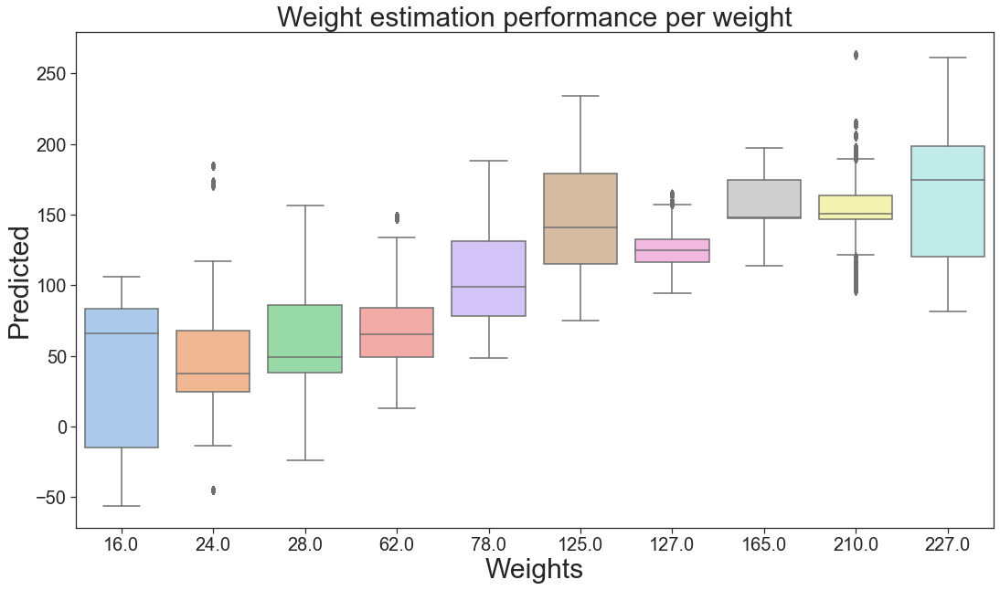

In [ ]:
import seaborn as sns
sns.set_theme(style="ticks", palette="pastel")
plt.figure(figsize=(18,10))
# Draw a nested boxplot to show bills by day and time
ax = sns.boxplot(x="Weights", y="Predicted",
            data=result_df)
ax.set_xlabel("Weights",fontsize=30)
ax.set_ylabel("Predicted",fontsize=30)
ax.set_title('Weight estimation performance per weight', fontsize=30)
ax.tick_params(labelsize=20)


In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
reg = LinearRegression()
parameters = {
              "fit_intercept": [True, False],
              'normalize': [True, False], 
             }

grid = GridSearchCV(estimator=reg, param_grid = parameters, cv = 5, n_jobs=6, verbose=3)    
grid.fit(X_train, y_train)
reg = grid.best_estimator_
reg.score(X_test,y_test)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


0.5822868240342973

In [ ]:
print_scores(reg,X_test, y_test )

R² score: 0.9876337265071691 	 Mean Absolute Error: 5.567433640546711 	 Mean Squared Error: 61.70742453601584


In [ ]:
y_pred = reg.predict(X_test)
result_df = pd.DataFrame(dict(Actual=y_test, Predicted=y_pred))
result_df = result_df.merge(weight_df, left_on='Actual', right_on='Weights')
result_df = result_df.loc[:, ('object', 'Weights', 'Predicted')]
result_df

,object,Weights,Predicted
0,marbleNet,210.0,159.977653
1,marbleNet,210.0,176.908773
2,marbleNet,210.0,182.837313
3,marbleNet,210.0,149.836964
4,marbleNet,210.0,194.515036
...,...,...,...
79471,screwDriver,125.0,209.713053
79472,screwDriver,125.0,134.913080
79473,screwDriver,125.0,102.860088
79474,screwDriver,125.0,85.221725


In [ ]:
def run_parameter_search(model, parameters, x_test,y_test, x_train, y_train):
    grid = GridSearchCV(estimator=model, param_grid = parameters, cv = 5, n_jobs=6, verbose=3)   
    grid.fit(x_train, y_train)
    best_model = grid.best_estimator_
    print(f'Best model: {best_model}')
    print_scores(best_model, x_test,y_test)
    return best_model

In [ ]:
from sklearn.linear_model import HuberRegressor

regressor = HuberRegressor(max_iter=10000)
parameters = {
              "epsilon": [1.10,1.20,1.30,1.40],
              'alpha': [0.0001,0.001,0.1], 
             }

run_parameter_search(regressor, parameters, X_test, y_test, X_train, y_train)


Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:   31.7s
[Parallel(n_jobs=6)]: Done  60 out of  60 | elapsed:  1.3min finished


Best model: HuberRegressor(alpha=0.1, epsilon=1.3, max_iter=10000)
R² score: -0.06929708331110884 	 Mean Absolute Error: 61.51942366039883 	 Mean Squared Error: 5150.936509418976


HuberRegressor(alpha=0.1, epsilon=1.3, max_iter=10000)

# Keras

In [ ]:
weights = np.array(balanced_df.Weights.unique())
test_weights = weights[np.random.choice(len(weights), size=2, replace=False)]
experiment_test = balanced_df[np.isin(balanced_df['Weights'], test_weights)]
experiment_train = balanced_df[np.invert(np.isin(balanced_df['Weights'], test_weights))]

array([ 28., 165.,  24., 210.,  16.,  78., 125., 227., 127.,  62.])

In [ ]:

test_weights

array([78., 24.])

In [ ]:

len(experiment_train)/len(experiments_df)

0.893390642615558

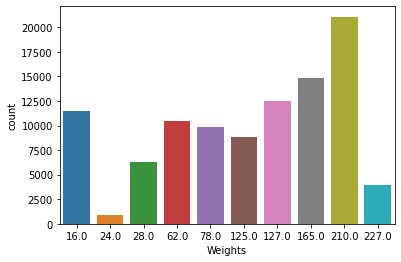

In [ ]:
sample_100K = lift_only.sample(n=100000, random_state=25)
X = np.array(sample_100K.iloc[:,:54])
y = np.array(sample_100K.Weights)
sns.countplot(x='Weights', data=sample_100K)

In [ ]:
X_train, X_test = np.array(experiment_train.iloc[:,:54]), np.array(experiment_test.iloc[:,:54])
y_train, y_test = np.array(experiment_train.Weights), np.array(experiment_test.Weights)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_digits
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.decomposition import PCA, NMF
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import StandardScaler, Normalizer

from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

In [ ]:


nm = Normalizer()

X_train = nm.fit_transform(X_train)
X_test = nm.transform (X_test)

X_train = X_train.reshape((X_train.shape[0]),3,6,3)
X_test = X_test.reshape((X_test.shape[0]),3,6,3)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D

from keras import backend as K

def r2_keras(y_true, y_pred):
    SS_res =  K.sum(K.square( y_true - y_pred )) 
    SS_tot = K.sum(K.square( y_true - K.mean(y_true) ) ) 
    return ( 1 - SS_res/(SS_tot + K.epsilon()) )

In [ ]:
batch_size = 1000
epochs =30000
# input image dimensions
img_rows, img_cols = 6, 3
input_shape = (3, img_rows, img_cols)

In [ ]:
len(X_train)/ (len(X_test) +len(X_train))

0.7985082138830729

In [ ]:
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

print('x_train shape:', X_train.shape)
print(X_train.shape[0], 'train samples')
print(X_test.shape[0], 'test samples')

x_train shape: (158654, 3, 6, 3)
158654 train samples
40034 test samples


In [ ]:
!rm -rf ./content/drive/MyDrive/MS_Project/Log
%reload_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/MS_Project/Log

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from tensorflow.keras.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint

import datetime, os


In [ ]:
check_point_dir = '/content/drive/MyDrive/MS_Project/Models/Split_pose_v3/check_points/'

model_checkpoint_callback = ModelCheckpoint(
    filepath=check_point_dir,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)

In [ ]:
logdir = os.path.join("/content/drive/MyDrive/MS_Project/Log", f'Split_pose_v7_{datetime.datetime.now().strftime("%Y%m%d-%H%M%S")}')
tensorboard_callback = TensorBoard(logdir, histogram_freq=1)

In [ ]:
from tensorflow import keras
opt = keras.optimizers.Adam(learning_rate=0.01)

In [ ]:
from tensorflow.keras.layers import (
    BatchNormalization, SeparableConv2D, MaxPooling2D, Activation, Flatten, Dropout, Dense
)
model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape = input_shape))

model.add(MaxPooling2D(pool_size=(2, 2),  padding='same'))

model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))

model.add(MaxPooling2D(pool_size=(2, 2),  padding='same'))
model.add(Flatten())

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.1))

model.add(Dense(256, activation='relu'))
#model.add(Dropout(0.1))

model.add(Dense(1, activation='linear'))


model.compile(loss='mean_squared_error', # one may use 'mean_absolute_error' as  mean_squared_error
                  optimizer=opt,
                  metrics=[r2_keras, mean_absolute_error] # you can add several if needed
                 )

model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 1, 4, 32)          896       
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 1, 2, 32)         0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 1, 2, 64)          18496     
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 1, 1, 64)         0         
 g2D)                                                            
                                                                 
 flatten_10 (Flatten)        (None, 64)                0         
                                                                 
 dense_30 (Dense)            (None, 128)             

In [ ]:
model.fit(X_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(X_test, y_test),
          callbacks=[tensorboard_callback, model_checkpoint_callback])
model.evaluate(X_test, y_test, verbose=3)

Streaming output truncated to the last 5000 lines.
Epoch 14173/30000
159/159 [==============================] - 1s 5ms/step - loss: 4902.6040 - r2_keras: -0.0059 - mean_absolute_error: 59.9208 - val_loss: 4545.9097 - val_r2_keras: -29941081047040.0000 - val_mean_absolute_error: 56.4819
Epoch 14174/30000
159/159 [==============================] - 1s 6ms/step - loss: 4911.5874 - r2_keras: -0.0074 - mean_absolute_error: 60.0010 - val_loss: 4605.4810 - val_r2_keras: -30878906449920.0000 - val_mean_absolute_error: 58.2058
Epoch 14175/30000
159/159 [==============================] - 1s 5ms/step - loss: 4912.6851 - r2_keras: -0.0076 - mean_absolute_error: 60.0470 - val_loss: 4609.7363 - val_r2_keras: -30922837590016.0000 - val_mean_absolute_error: 58.2541
Epoch 14176/30000
159/159 [==============================] - 1s 5ms/step - loss: 4911.6543 - r2_keras: -0.0075 - mean_absolute_error: 60.0105 - val_loss: 4541.4302 - val_r2_keras: -30089731375104.0000 - val_mean_absolute_error: 56.9513
Epoch

In [ ]:
model.save('/content/drive/MyDrive/MS_Project/Models/Split_objects/Final_model3/')

In [ ]:
y_pred = model.predict(X_test)
y_pred = pd.Series(y_pred.flatten())

In [ ]:
result_df = pd.DataFrame(dict(Actual=np.array(y_test), Predicted=y_pred))
result_df = result_df.merge(weight_df, left_on='Actual', right_on='Weights')
result_df = result_df.loc[:, ('object', 'Weights', 'Predicted')]
result_df.to_excel('/content/drive/MyDrive/MS_Project/Split_objects_CNN_result_final.xlsx')

In [ ]:
sns.set_theme(style="ticks")
plt.figure(figsize=(18,10))
# Draw a nested boxplot to show bills by day and time
ax = sns.boxplot(x="Weights", y="Predicted",
            data=result_df)
ax.set_xlabel("Weights",fontsize=30)
ax.set_ylabel("Predicted",fontsize=30)
ax.set_title('Weight estimation performance per weight', fontsize=30)
ax.tick_params(labelsize=20)

In [ ]:
!tensorboard dev upload --logdir /content/drive/MyDrive/MS_Project/Log --name "CNN only v2 final" --description "Weight estimation using uSkin sensor data with just lift phase" 

Upload started and will continue reading any new data as it's added to the logdir.

To stop uploading, press Ctrl-C.

New experiment created. View your TensorBoard at: https://tensorboard.dev/experiment/6uqTRNI2Sr6yCzwH7bZ56g/

[2022-08-12T00:18:19] Started scanning logdir.
[2022-08-12T00:18:21] Total uploaded: 0 scalars, 692 tensors (497.4 kB), 1 binary objects (47.9 kB)
Listening for new data in logdir...

Interrupted. View your TensorBoard at https://tensorboard.dev/experiment/6uqTRNI2Sr6yCzwH7bZ56g/


In [ ]:
!pip install keras-visualizer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from keras_visualizer import visualizer 

In [ ]:
from keras.utils.vis_utils import plot_model

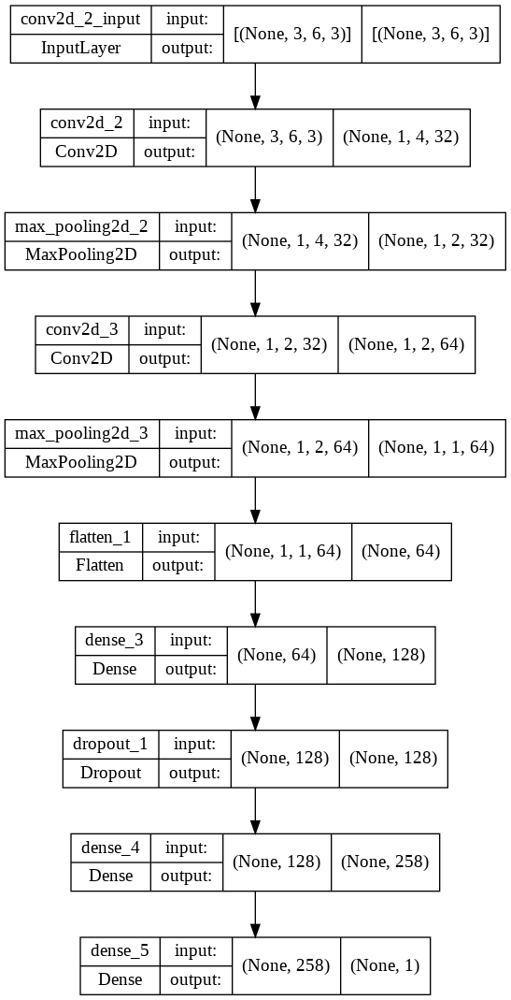

In [ ]:
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
pip install visualkeras

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 989 kB 4.1 MB/s 


In [ ]:
import visualkeras
from PIL import ImageFont

In [ ]:
visualkeras.layered_view(model) 

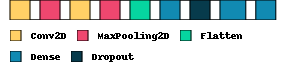

In [ ]:
from PIL import ImageFont
visualkeras.layered_view(model, legend=True, draw_volume=False) 

In [ ]:
pip install netron

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.5 MB 5.2 MB/s 


In [ ]:
!pip install ann_visualizer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for ann-visualizer: filename=ann_visualizer-2.5-py3-none-any.whl size=4168 sha256=deba1ffdd654c90d7a1cee7e7bb0505adb4a7325319e775b58f8e1daf00d481e
  Stored in directory: /root/.cache/pip/wheels/1b/fc/58/2ab1c3b30350105929308becddda4fb59b1358e54f985e1f4a
Successfully built ann-visualizer


In [ ]:
from ann_visualizer.visualize import ann_viz
ann_viz(model)


ValueError: ignored